# Capstone Project two: 

The Hawaii Natural Energy Institute examined 14 NMC-LCO 18650 batteries with a nominal capacity of 2.8 Ah, cycled over 1000 times at 25 °C with a CC-CV charge rate of C/2 and a discharge rate of 1.5 C. The dataset includes voltage and current patterns observed during each cycle, which can be used to forecast the remaining useful life (RUL) of the batteries. It provides a summary of the performance data for 14 batteries.

The dataset is built by IGNACIO VINUALES, and the process is described in https://github.com/ignavinuales/Battery_RUL_Prediction. The data is available for download on https://www.kaggle.com/datasets/ignaciovinuales/battery-remaining-useful-life-rul.

> ## A. Data Wrangling

In [5]:
# importing all required methods and libraries.
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport
%matplotlib inline

In [6]:
# Loading the battery data.
RUL_raw = pd.read_csv("Battery_RUL.csv")

In [7]:
# looking at first five rows to see the data structure.
RUL_raw.head()

,Cycle_Index,Discharge Time (s),Decrement 3.6-3.4V (s),Max. Voltage Dischar. (V),Min. Voltage Charg. (V),Time at 4.15V (s),Time constant current (s),Charging time (s),RUL
0,1,2595.30,1151.488500,3.670,3.211,5460.001,6755.01,10777.82,1112
1,2,7408.64,1172.512500,4.246,3.220,5508.992,6762.02,10500.35,1111
2,3,7393.76,1112.992000,4.249,3.224,5508.993,6762.02,10420.38,1110
3,4,7385.50,1080.320667,4.250,3.225,5502.016,6762.02,10322.81,1109
4,6,65022.75,29813.487000,4.290,3.398,5480.992,53213.54,56699.65,1107


First look at the dataframe suggests existance of 9 columns as follows:
> i. Cycle Index \
 ii. Discharge Time (s)\
 iii. Decrement 3.6-3.4V (s)\
 iv. Max. Voltage Discharge (V)\
 v. Min. Voltage Charge (V)\
 vi. Time at 4.15V (s)\
 vii. Time Constant Current (s)\
 viii. Charging Time (s)\
 ix. RUL

i. `Cycle_Index` represents a particular battery cycle. This will start with 1 for each battery and will reach its maximum until the battery `state of health (SOH)` goes below the threshold value. \
ii. `Discharge Time (s)` is the time in seconds that takes the voltage to reach its minimun value in one discharge cycle.\
iii. `Decrement 3.6-3.4V (s)` represents the time in seconds which the voltage takes to drop from `3.6 V` to `3.4 V` during a discharge cycle.\
iv. `Max. Voltage Dischar. (V)` is the initial and maximum voltage in the discharging phase.\
v. `Min. Voltage Charg. (V)` is the initial value of Voltage when charging.\
vi. `Time at 4.15V (s)` is the time to reach `4.15V` in charging phase.\
vii. `Time constant current (s)` is the time in which the current stays constant at its maximum value.\
viii. `Charging time (s)` is the total time in seconds for charging.\
ix. `RUL` is the remaining usefull live in terms of number of remaining charge descharge cycles before the `SOH` goes below threshold.

In [10]:
# Checking the shape of the dataframe.
RUL_raw.shape

(15064, 9)

In [11]:
# Summary of the battery dataset.
RUL_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15064 entries, 0 to 15063
Data columns (total 9 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Cycle_Index                15064 non-null  int64  
 1   Discharge Time (s)         15064 non-null  float64
 2   Decrement 3.6-3.4V (s)     15064 non-null  float64
 3   Max. Voltage Dischar. (V)  15064 non-null  float64
 4   Min. Voltage Charg. (V)    15064 non-null  float64
 5   Time at 4.15V (s)          15064 non-null  float64
 6   Time constant current (s)  15064 non-null  float64
 7   Charging time (s)          15064 non-null  float64
 8   RUL                        15064 non-null  int64  
dtypes: float64(7), int64(2)
memory usage: 1.0 MB


In [12]:
# Checking to see if the dataset includes any duplicated data.
RUL_raw.duplicated().sum()

0

In [13]:
# # Checking to see if the dataset includes any NULL values.
RUL_raw.isnull().sum()

Cycle_Index                  0
Discharge Time (s)           0
Decrement 3.6-3.4V (s)       0
Max. Voltage Dischar. (V)    0
Min. Voltage Charg. (V)      0
Time at 4.15V (s)            0
Time constant current (s)    0
Charging time (s)            0
RUL                          0
dtype: int64

In [14]:
# Statistical summary of the battery dataset.
RUL_raw.describe()

,Cycle_Index,Discharge Time (s),Decrement 3.6-3.4V (s),Max. Voltage Dischar. (V),Min. Voltage Charg. (V),Time at 4.15V (s),Time constant current (s),Charging time (s),RUL
count,15064.000000,15064.000000,15064.000000,15064.000000,15064.000000,15064.000000,15064.000000,15064.000000,15064.000000
mean,556.155005,4581.273960,1239.784672,3.908176,3.577904,3768.336171,5461.266970,10066.496204,554.194172
std,322.378480,33144.012077,15039.589269,0.091003,0.123695,9129.552477,25155.845202,26415.354121,322.434514
min,1.000000,8.690000,-397645.908000,3.043000,3.022000,-113.584000,5.980000,5.980000,0.000000
25%,271.000000,1169.310000,319.600000,3.846000,3.488000,1828.884179,2564.310000,7841.922500,277.000000
50%,560.000000,1557.250000,439.239471,3.906000,3.574000,2930.203500,3824.260000,8320.415000,551.000000
75%,833.000000,1908.000000,600.000000,3.972000,3.663000,4088.326500,5012.350000,8763.282500,839.000000
max,1134.000000,958320.370000,406703.768000,4.363000,4.379000,245101.117000,880728.100000,880728.100000,1133.000000


First inspection of the statistical summary shows negative values for times for two columns *viz.* `Decrement 3.6-3.4V (s)` & `Time at 4.15V (s)`. Which is theoretically not possible. These data may be caused by machine issues or some other sources of error. Removing these values will be best. before actually visualizing all outliers.

In [16]:
RUL_raw = RUL_raw[~(RUL_raw<0).any(axis=1)].reset_index(drop=True)

In [17]:
RUL_raw.describe()

,Cycle_Index,Discharge Time (s),Decrement 3.6-3.4V (s),Max. Voltage Dischar. (V),Min. Voltage Charg. (V),Time at 4.15V (s),Time constant current (s),Charging time (s),RUL
count,15031.000000,15031.000000,15031.000000,15031.000000,15031.000000,15031.000000,15031.000000,15031.000000,15031.000000
mean,556.501563,4265.676749,1442.170625,3.907649,3.577959,3679.402558,5321.700476,9934.158147,553.849045
std,322.415253,31899.898072,13793.943027,0.090082,0.122206,8818.901831,24547.558775,25864.035804,322.470885
min,1.000000,8.690000,31.168831,3.043000,3.022000,14.052000,5.980000,5.980000,0.000000
25%,271.000000,1168.780000,320.000000,3.846000,3.489000,1828.884429,2564.310000,7842.095000,277.000000
50%,560.000000,1555.940000,439.285714,3.906000,3.574000,2924.359000,3824.250000,8319.690000,550.000000
75%,834.000000,1908.000000,600.000000,3.971000,3.663000,4082.375000,5012.350000,8760.220000,839.000000
max,1134.000000,958320.370000,406703.768000,4.363000,4.300000,245101.117000,880728.100000,880728.100000,1133.000000


In [18]:
profile_raw = ProfileReport(RUL_raw, title="Profiling Report")
profile_raw

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Clearly some of the columns has outliers

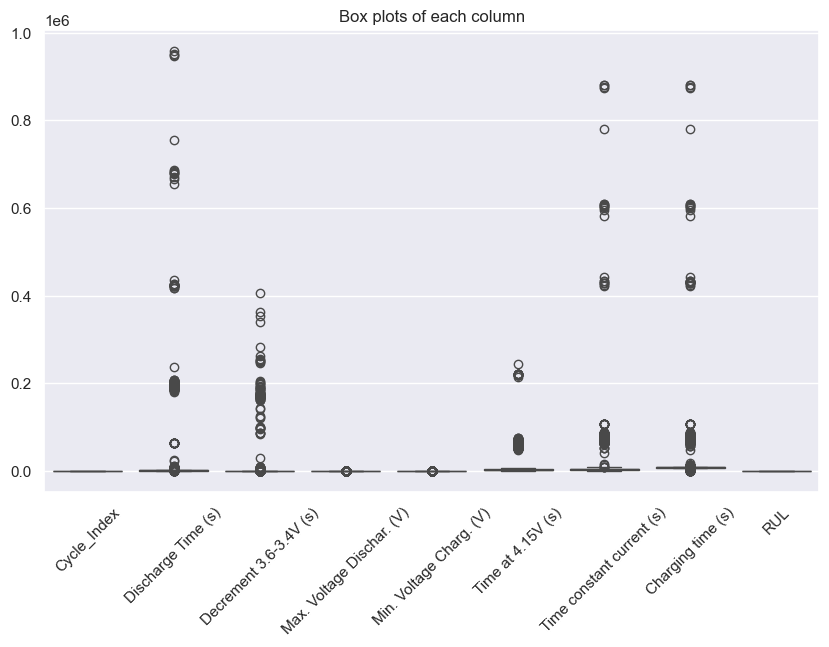

In [20]:
sns.set()
plt.figure(figsize=(10, 6))
sns.boxplot(data=RUL_raw)
plt.title('Box plots of each column')
plt.xticks(rotation=45)
plt.show()

Now lets have a closer look at the data

In [22]:
RUL_raw.head(20)

,Cycle_Index,Discharge Time (s),Decrement 3.6-3.4V (s),Max. Voltage Dischar. (V),Min. Voltage Charg. (V),Time at 4.15V (s),Time constant current (s),Charging time (s),RUL
0,1,2595.30,1151.488500,3.670,3.211,5460.001000,6755.01,10777.82,1112
1,2,7408.64,1172.512500,4.246,3.220,5508.992000,6762.02,10500.35,1111
2,3,7393.76,1112.992000,4.249,3.224,5508.993000,6762.02,10420.38,1110
3,4,7385.50,1080.320667,4.250,3.225,5502.016000,6762.02,10322.81,1109
4,6,65022.75,29813.487000,4.290,3.398,5480.992000,53213.54,56699.65,1107
5,7,3301.18,1194.235077,3.674,3.504,5023.633636,5977.38,5977.38,1106
6,8,5955.30,1220.135329,4.013,3.501,5017.495000,5967.55,5967.55,1105
7,9,5951.20,1220.135329,4.014,3.501,5017.496000,5962.21,5962.21,1104
8,10,5945.44,1216.920914,4.014,3.501,5009.993667,5954.91,5954.91,1103
9,11,435251.49,263086.078000,4.267,3.086,269.984000,443700.02,443700.02,1102


There are some data where the times suddenly changes from one row to another by more than a factor of 5 (Row 3 to 4 and row 15062	 to 15063 above). My experience in battery work suggest that this happens due to battery being defective or machine not working properly or sudden movement of battery while measurement or other random factors. Researcher generally tend to remove these data. Lets first see how many times this happens.

In [24]:
rows_to_append = []

# Loop through the DataFrame to identify jumps
for i in range(len(RUL_raw) - 1):  # Iterate up to second last row to avoid index out of range
    prev_value = RUL_raw["Discharge Time (s)"].iloc[i]
    next_value = RUL_raw["Discharge Time (s)"].iloc[i + 1]
    
    if next_value > 5 * prev_value:
        # Append the rows that satisfy the condition to the list
        rows_to_append.append(RUL_raw.iloc[i])
        rows_to_append.append(RUL_raw.iloc[i + 1])

# Convert the list of rows to a DataFrame
jumps = pd.DataFrame(rows_to_append).drop_duplicates().reset_index(drop=True)
jumps

,Cycle_Index,Discharge Time (s),Decrement 3.6-3.4V (s),Max. Voltage Dischar. (V),Min. Voltage Charg. (V),Time at 4.15V (s),Time constant current (s),Charging time (s),RUL
0,4.0,7385.50,1080.320667,4.250,3.225,5502.016000,6762.02,10322.81,1109.0
1,6.0,65022.75,29813.487000,4.290,3.398,5480.992000,53213.54,56699.65,1107.0
2,10.0,5945.44,1216.920914,4.014,3.501,5009.993667,5954.91,5954.91,1103.0
3,11.0,435251.49,263086.078000,4.267,3.086,269.984000,443700.02,443700.02,1102.0
4,15.0,6008.07,1065.372059,4.045,3.480,5033.075769,5954.47,5954.47,1098.0
...,...,...,...,...,...,...,...,...,...
378,997.0,1028.06,279.428571,3.820,3.669,1592.375000,2240.38,7973.94,115.0
379,1018.0,34.43,31.168831,3.156,3.673,100.302500,8.00,8.23,94.0
380,1019.0,860.45,216.928571,3.793,3.725,1187.351000,1772.35,7234.43,93.0
381,1111.0,773.88,162.374667,3.763,3.839,539.375000,1148.00,7660.62,1.0


Out of more than 15000 rows, it seems this jump happens 382/2 = 191 times with two condition.
* Condition 1: When Discharge Time (s) is << median and next cycle increases it more than 5 fold. In this case previous cylce is defective and needs to be removed. This can be achived by lower threshold such as 5 % of threshold data.
* Condition 2: When Discharge Time (s) is ~ median and next cycle increases it more than 5 fold. In this case next cycle is defective data and we should remove this.

  This can be achived by droping data that are more than certain upper threshold. Best practice is to drop data that are 3 times higher than interquartile range above median. 
**Note:** Sometimes two or more defective data lie together which is not visible from above approach.

In [26]:
mask = pd.Series([True] * len(RUL_raw))

for column in RUL_raw.columns:
    median = RUL_raw[column].median()
    q1 = RUL_raw[column].quantile(0.25)
    q3 = RUL_raw[column].quantile(0.75)
    iqr = q3 - q1
    
    lower_bound = median - 3 * iqr
    upper_bound = median + 3 * iqr
    
    column_mask = (RUL_raw[column] >= lower_bound) & (RUL_raw[column] <= upper_bound)
    mask = mask & column_mask

# Apply the mask to filter the DataFrame
RUL_cleaned = RUL_raw[mask].reset_index(drop=True)

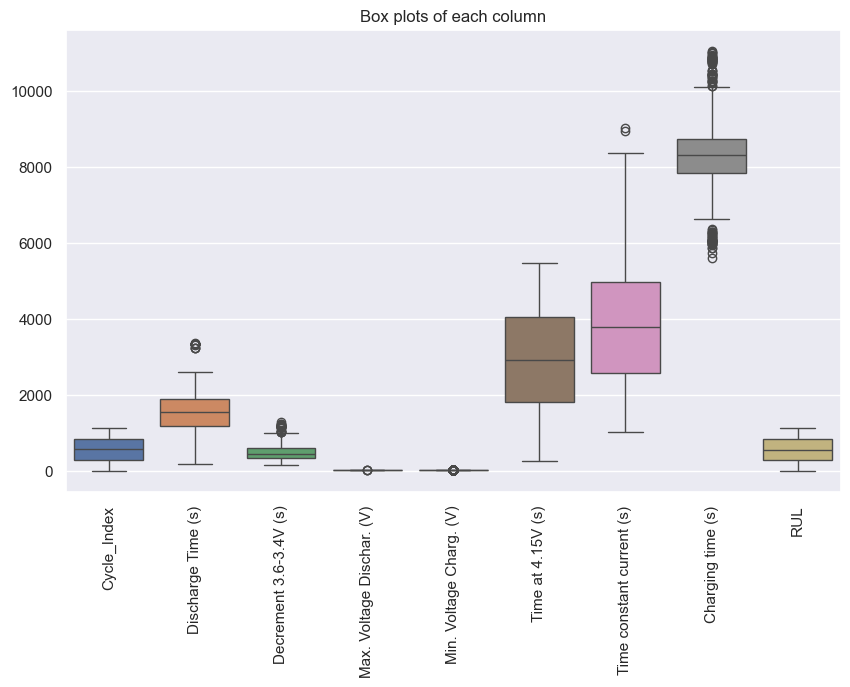

In [27]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=RUL_cleaned)
plt.title('Box plots of each column')
plt.xticks(rotation=90)
plt.show()

In [28]:
RUL_cleaned

,Cycle_Index,Discharge Time (s),Decrement 3.6-3.4V (s),Max. Voltage Dischar. (V),Min. Voltage Charg. (V),Time at 4.15V (s),Time constant current (s),Charging time (s),RUL
0,1,2595.30,1151.488500,3.670,3.211,5460.001000,6755.01,10777.82,1112
1,7,3301.18,1194.235077,3.674,3.504,5023.633636,5977.38,5977.38,1106
2,12,3228.58,1135.349333,3.689,3.485,5033.075692,5969.89,5969.89,1101
3,17,2261.34,883.200000,4.038,3.901,1949.664000,2922.69,6070.11,1096
4,18,2259.46,883.199000,4.042,3.373,5181.377000,6161.38,9310.98,1095
...,...,...,...,...,...,...,...,...,...
14691,1107,773.00,180.480000,3.774,3.742,922.712000,1412.31,6659.62,5
14692,1108,770.44,179.523810,3.773,3.742,922.775000,1412.38,6678.88,4
14693,1109,771.12,179.523810,3.773,3.744,915.512000,1412.31,6670.38,3
14694,1110,769.12,179.357143,3.773,3.742,915.513000,1412.31,6637.12,2


In [29]:
profile_cleaned = ProfileReport(RUL_cleaned, title="Profiling Report")
profile_cleaned

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Clearly the data now is much more clean and workable. Now, saving this data for EDA step.

In [53]:
RUL_cleaned.to_csv('../EDA/RUL_cleaned.csv', index=False)